# Домашнее задание №2

<span style="color: red; font-size: 14pt">Дедлайн: 13 марта 23:59</span>

Машинное обучение, ФИВТ, Весна 2018

Составлено с использованием материалов Евгения Колмакова и Юрия Кашницкого (открытый курс машинного обучения, тема 3), а также лекций по машинному обучению Евгения Соколова

**Оформление дз**: 
- Присылайте выполненное задание на почту ``ml.course.mipt@gmail.com``
- Укажите тему письма в следующем формате ``ML2018_fall <номер_группы> <фамилия>``, к примеру -- ``ML2018_fall 596 ivanov``
- Выполненное дз сохраните в файл ``ML2018_<фамилия>_<группа>_task<номер задания>.ipnb``, к примеру -- ``ML2018_ivanov_596_task1.ipnb``

**Вопросы**:
- Присылайте вопросы на почту ``ml.course.mipt@gmail.com``
- Укажите тему письма в следующем формате ``ML2018_fall Question <Содержание вопроса>``

--------
- **PS1**: Используются автоматические фильтры, мы не найдем ваше дз, если вы укажете тему письма в неправильном формате.
- **PS2**: Просроченный дедлайн снижает максимальный вес задания по формуле, указнной на первом семинаре

## Часть 0. Вопросы для самоконтроля

##### Перед выполнением задания убедитесь, что вы знаете ответы на этот теор.минимум
##### Эта часть задания не оценивается, ответы можно не записывать

1. Что такое решающее дерево? Как по построенному дереву найти прогноз для объекта?
2. Почему для любой выборки можно построить дерево, имеющее нулевую ошибку на ней? Приведите примеры.
3. Почему не рекомендуется строить небинарные деревья (имеющие более двух потомков у каждой вершины)?
4. Как устроен жадный алгоритм построения дерева?
5. Какие критерии информативности для решения задачи классификации вы знаете?
6. Какой смысл у критерия Джини и энтропийного критерия?
7. Какие критерии информативности для решения задачи регрессии вы знаете?
8. Что такое pruning (стрижка) дерева? Чем отличаются post-pruning и pre-pruning?
9. Какие методы обработки пропущенных значений вы знаете?
10. Как учитывать категориальные признаки в решающем дереве?
11. Что такое mean target encoding? Почему эта техника хорошо работает для решающих деревьев?
12. Как работает отбор признаков с помощью решающих деревьев?

## Часть 1. Теоретические задачи

##### 30% баллов за задание, оценочное время выполнения 1 час

##### Решение можно затехать здесь или написать от руки и добавить фото в ноутбук

### Задача 1 (10% баллов)

Какая стратегия поведения в листьях регрессионного дерева приводит к меньшему матожиданию ошибки по MSE: отвечать средним значением таргета на объектах обучающей выборки, попавших в лист, или отвечать таргетом для случайного объекта из листа (считая все объекты равновероятными)?

** Решение: ** 

$y_{true}$ -- верный ответ, $y_{leaf}$ -- ответы в листе.

Первая ошибка по MSE: отвечать средним значением таргета на объектах обучающей выборки, попавших в лист
$err_{1} = (y_{true} - \overline{y_{leaf}})^2 = y_{true}^2 - 2 y_{true} \overline{y_{leaf}} + \overline{y_{leaf}}^2$

Вторая ошибка по MSE: отвечать таргетом для случайного объекта из листа (считая все объекты равновероятными). Пусть объектов в листе $n$: $err_{2} = \frac{\sum\limits_{y \in y_{leaf}} (y_{true} - y)^2}{n} = y_{true}^2 - 2 y_{true} \overline{y_{leaf}} + \overline{y_{leaf}^2}$

В силу положительности дисперсии $\overline{y_{leaf}}^2 \leq \overline{y_{leaf}^2}$ имеем, что $err_1 \leq err_2 \Rightarrow $ первая стратегия лучше.

### Задача 2 (15% баллов)

Критерий информативности для набора объектов $L$ вычисляется на основе того, насколько хорошо их целевые переменные предсказываются константой (при оптимальном выборе этой константы):
$$H(R) = \min_{c \in Y} \dfrac{1}{|R|} \sum_{(x_i,y_i) \in R} L(y_i, c),$$
где $L(y_i, c)$- некоторая функция потерь. Соответственно, чтобы получить вид критерия при конкретной функции потерь, необходимо аналитически найти оптимальное значение константы и подставить его в формулу для $H(R)$.

Выведите критерии информативности для следующих функций потерь:
1. $L(y,c) = (y-c)^2$
2. $L(y,c) = \sum_{k=1}^K (c_k-[y=k])^2$
3. $L(y,c) = -\sum_{k=1}^K [y=k]\log c_k$

**Подсказка**:
должны получиться дисперия, критерий Джини и энтропийный критерий.

1\. $\ L(y,c) = (y-c)^2$

$H(R) = \min_{c \in Y} \dfrac{1}{|R|} \sum_{(x_i,y_i) \in R} (y_i-c)^2$

Найдем минимум функции $f$:

$f(c) = \dfrac{1}{|R|} \sum_{(x_i,y_i) \in R} (y_i-c)^2$

$f'(c) = -\dfrac{2}{|R|} \sum_{(x_i,y_i) \in R} (y_i-c) = 0 \ \ \Rightarrow \ \ c = \overline{y} $

Тогда:

$$H(R) =  \dfrac{1}{|R|} \sum_{(x_i,y_i) \in R} (y_i - \overline{y})^2 = \dfrac{1}{|R|} \sum_{(x_i,y_i) \in R} (y_i - \dfrac{1}{|R|} \sum_{(x_i,y_i) \in R} y_i)^2$$

Что и есть дисперсия. Чем меньше дисперсия целевой переменной, тем лучше разбиение.


2\. $\  L(y,c) = \sum_{k=1}^K (c_k-[y=k])^2$

$H(R) = \min_{c \in Y} \dfrac{1}{|R|} \sum_{(x_i,y_i) \in R} \sum_{k=1}^K (c_k-[y=k])^2$

Найдем минимум функции $f$:

$f(c) = \dfrac{1}{|R|} \sum_{(x_i,y_i) \in R} \sum_{k=1}^K (c_k-[y=k])^2 = \dfrac{1}{|R|} \sum_{k=1}^K \sum_{(x_i,y_i) \in R} (c_k-[y=k])^2$

$f'_{c_j}(c) = \frac{2}{|R|}\sum(c_j-[y=j]) = 0 \ \ \Rightarrow \ \ c_j = \frac{\sum [y=j]}{|R|} = p_j$ $\ \ \Rightarrow \ \ $ $c^* = (p_1, \dots, p_K)$

Тогда:

$H(R) = \dfrac{1}{|R|} \sum_{(x_i,y_i) \in R} \sum_{k=1}^K (p_k-[y=k])^2 = \dfrac{1}{|R|} \sum_{k=1}^K \sum_{(x_i,y_i) \in R} (p_k^2 - 2 p_k [y=k] + [y=k]) = \dfrac{1}{|R|} \sum_{k=1}^K (|R|p_k^2 - 2 |R| p_k^2 + |R|p_k) = \sum_{k=1}^K p_k(1-p_k)$

Что и есть критерий Джини.

3\. $L(y,c) = -\sum_{k=1}^K [y=k]\log c_k$. Тут, как выяснилось, не хватает условия $\sum_{k=1}^K c_k = 1$

$H(R) = \min_{c \in Y} \dfrac{1}{|R|} \sum_{(x_i,y_i) \in R} \left[-\sum_{k=1}^K [y=k]\log c_k\right]$

Найдем минимум функции $f$. Для этого нужно решить задачу условной оптимизации:

$\begin{cases}
f(c) = \dfrac{1}{|R|} \sum_{(x_i,y_i) \in R} \left[-\sum_{k=1}^K [y=k]\log c_k\right] \to \min\\
\sum_{k=1}^K c_k = 1
\end{cases}$

Выпишем лагранжиан этой задачи:

$L(c, \lambda) = \dfrac{1}{|R|} \sum_{(x_i,y_i) \in R} \left[-\sum_{k=1}^K [y=k]\log c_k\right] + \lambda (\sum_{k=1}^K c_k - 1)$

Найдем его минимум: этот минимум также будет являться минимумом нашей функции $f$ при заданном условии (по методу множителей Лагранжа). Для этого продифференцируем и приравняем к 0 наш лагранжиан по $c_k \ \ \forall \ k \in [1, K]$:

$\frac{\partial}{\partial c_k} L(c, \lambda) = \frac{1}{|R|}\sum_{(x_i,y_i) \in R} \left[ \frac{[y_i = k]}{c_k} \right] + \lambda = 0 \ \ \Rightarrow \ \ c_k = \frac{p_k}{\lambda}$

Подставим это значение $c_k$ в условие:

$1 = \sum_{k=1}^K c_k = \frac{1}{\lambda} \sum_{k=1}^K p_k \ \ \Rightarrow \ \ \lambda = 1 \ \ \Rightarrow \ \ c_k^* = p_k$

И, наконец, подставляем оптимальное значение $c^* = (p_1, \dots, p_K)$ в $H$:

$H(R) = \dfrac{1}{|R|} \sum_{(x_i,y_i) \in R} \left[-\sum_{k=1}^K [y_i=k]\log p_k \right] = -\dfrac{1}{|R|} \sum_{k=1}^K \sum_{(x_i,y_i) \in R} [y_i=k]\log p_k = - \sum_{k=1}^K p_k\log p_k$

А это и есть энтропийный критерий :)

### Задача 3 (5% баллов)

Запишите оценку сложности построения одного решающего дерева в зависимости от размера обучающей выборки $l$, числа признаков $d$, максимальной глубины дерева $D$. В качестве предикатов используются пороговые функции $[x_j>t]$. При выборе предиката в каждой вершине перебираются все признаки, а в качестве порогов рассматриваются величины $t$, равные значения этого признака на объектах, попавших в текущую вершину. Считайте сложность вычисления критерия информативноси константной.

** Решение: **

Рассмотрим построение дерева от корня к листьям: в корне мы перебираем все признаки и все значения (в худшем случае они все различные). Это есть $O(ld)$ операции. 

Далее мы выбрали оптимальный порог и разбиваем нашу вершину на две. Пусть при разбиении $r$ элементов ушло направо, тогда $l - r$ элементов ушло налево. Аналогично: в правом поддереве нужно совершить  $O(rd)$ операций, а в левом $O((l -r)d)$ операций. Значит и на втором уровне мы получили опять $O(ld)$ операций. 

Аналогично: на любом уровне мы совершим $O(ld)$ операций. 

Всего уровней $D$, значит итоговая временная сложность построения одного решающего дерева есть $O(ldD)$

## Часть 2. Визуализация решающих деревьев

##### 20% баллов за задание, оценочное время выполнения 30 минут

Для начала нужно поставить GraphViz

- На macOS:
    - sudo pip install pydotplus
    - brew install graphviz
- Linux должно работать то же самое с заменой brew на sudo apt-get
    - sudo pip install pydotplus
    - sudo apt-get install graphviz
- Windows
    - Установить GraphViz отсюда: http://www.graphviz.org/Download_windows.php
    - Добавить путь к папке bin в PATH (например, "C:\Programs\Graphviz2.38\bin")
    - pip install pydotplus

Постройте решающее дерево из sklearn на датасете Car Evaluation Dataset (https://archive.ics.uci.edu/ml/datasets/car+evaluation)

In [279]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import LabelEncoder
import pandas as pd
import matplotlib.pyplot as plt

%matplotlib inline

In [280]:
# Ваш код здесь
!wget https://archive.ics.uci.edu/ml/machine-learning-databases/car/car.data

--2018-03-13 01:13:50--  https://archive.ics.uci.edu/ml/machine-learning-databases/car/car.data
Resolving archive.ics.uci.edu... 128.195.10.249
Connecting to archive.ics.uci.edu|128.195.10.249|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 51867 (51K) [text/plain]
Saving to: ‘car.data.2’

car.data.2          100%[===================>]  50.65K   126KB/s    in 0.4s    

2018-03-13 01:13:52 (126 KB/s) - ‘car.data.2’ saved [51867/51867]



In [282]:
columns = ['buying', 'maint', 'doors', 'persons', 'lug_boot', 'safety', 'eval']
car_df = pd.read_csv('./car.data', header=None, names=columns)

In [283]:
car_df[:10]

,buying,maint,doors,persons,lug_boot,safety,eval
0,vhigh,vhigh,2,2,small,low,unacc
1,vhigh,vhigh,2,2,small,med,unacc
2,vhigh,vhigh,2,2,small,high,unacc
3,vhigh,vhigh,2,2,med,low,unacc
4,vhigh,vhigh,2,2,med,med,unacc
5,vhigh,vhigh,2,2,med,high,unacc
6,vhigh,vhigh,2,2,big,low,unacc
7,vhigh,vhigh,2,2,big,med,unacc
8,vhigh,vhigh,2,2,big,high,unacc
9,vhigh,vhigh,2,4,small,low,unacc


Визуализируйте получившееся дерево с помощью GraphViz (следующая функция может помочь):

In [284]:
import IPython.display #needed to render in notebook
from io import StringIO
import pydot  #needed to convert dot format to png
from sklearn import tree

def draw_decision_tree(clf, column_names):
    dot_data = StringIO() 
    tree.export_graphviz(clf, out_file=dot_data, feature_names=column_names) 
    graph = pydot.graph_from_dot_data(dot_data.getvalue())
    a = IPython.display.Image(graph[0].create_png())
    IPython.display.display(a)

In [285]:
car_df[:2]

,buying,maint,doors,persons,lug_boot,safety,eval
0,vhigh,vhigh,2,2,small,low,unacc
1,vhigh,vhigh,2,2,small,med,unacc


In [286]:
encoder = LabelEncoder()
for col in columns:
    car_df[col] = encoder.fit_transform(car_df[col])

X = car_df.drop('eval', axis=1).values
y = car_df['eval'].values

In [287]:
clf = DecisionTreeClassifier()
clf.fit(X, y)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

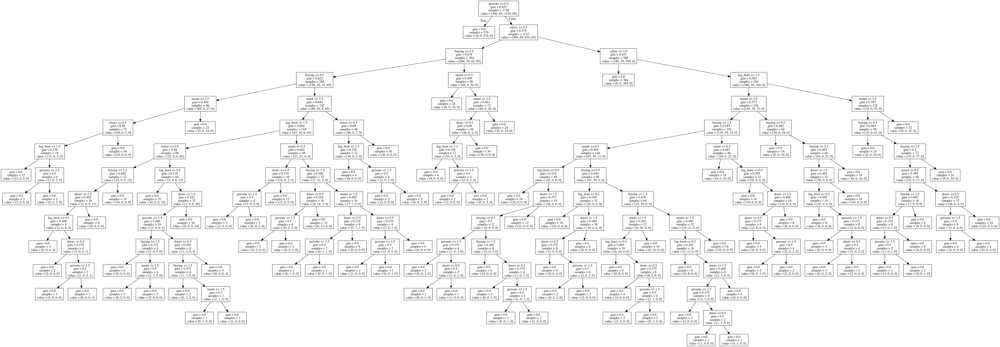

In [38]:
draw_decision_tree(clf, columns[:-1])

Посмотрите, как меняется картинка для различных значений структурных параметров (варьируйте параметры max_depth, criterion, min_samples_leaf, max_features).

In [58]:
params = {
    'max_depth': [None, 2, 5, 10],
    'criterion': ['gini', 'entropy'],
    'min_samples_leaf': [0.1, 0.5, 1],
    'max_features': ['sqrt', 'log2', None]
}



*********************************************************************
---------------------------------------------------------------------

*********************************** max_depth = None ***********************************


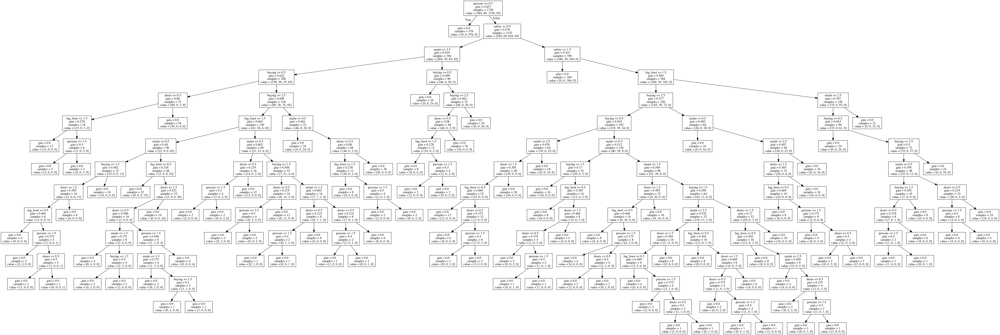



*********************************************************************
---------------------------------------------------------------------

*********************************** max_depth = 2 ***********************************


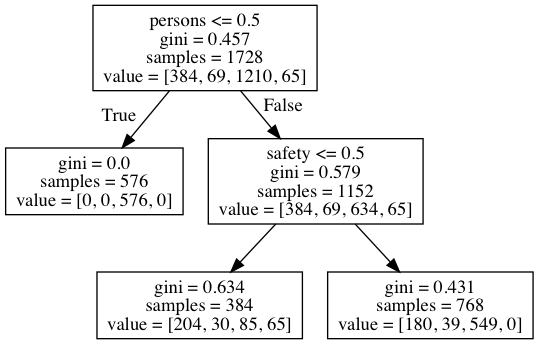



*********************************************************************
---------------------------------------------------------------------

*********************************** max_depth = 5 ***********************************


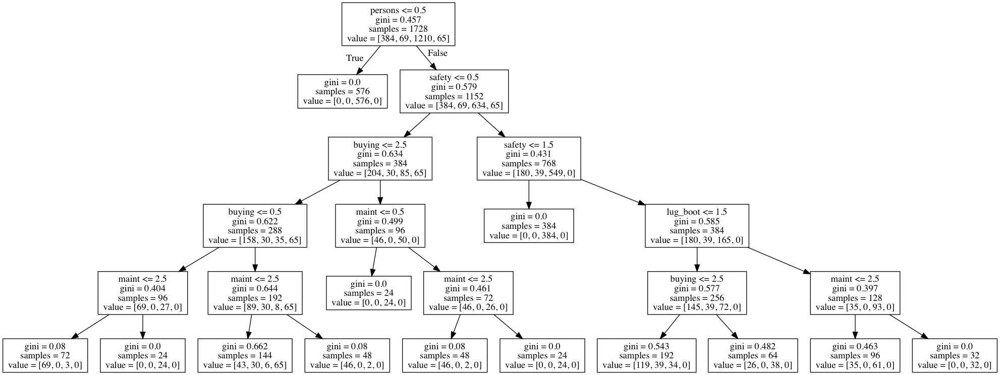



*********************************************************************
---------------------------------------------------------------------

*********************************** max_depth = 10 ***********************************


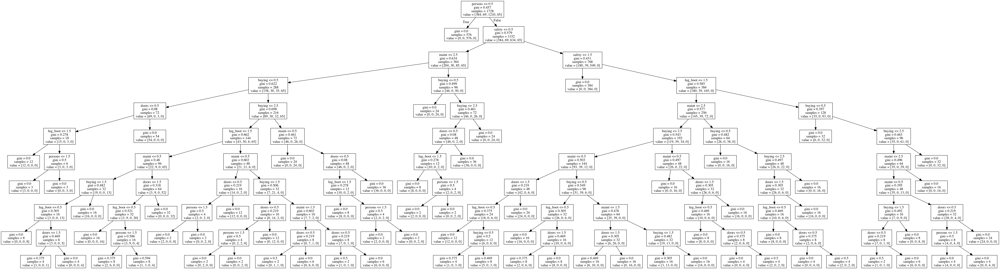



*********************************************************************
---------------------------------------------------------------------

*********************************** criterion = gini ***********************************


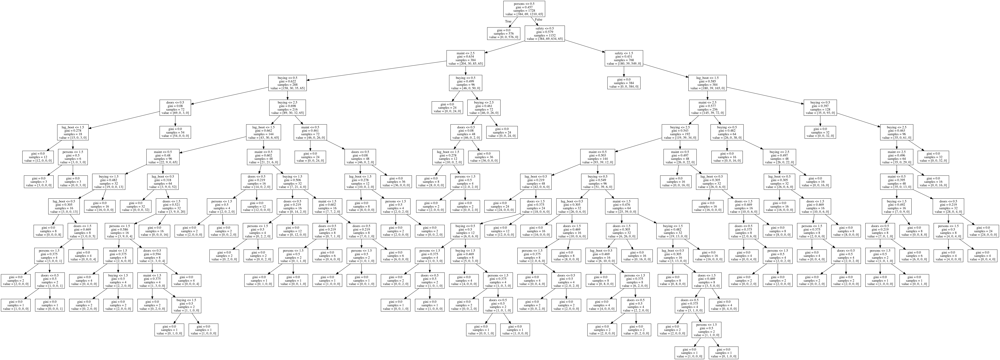



*********************************************************************
---------------------------------------------------------------------

*********************************** criterion = entropy ***********************************


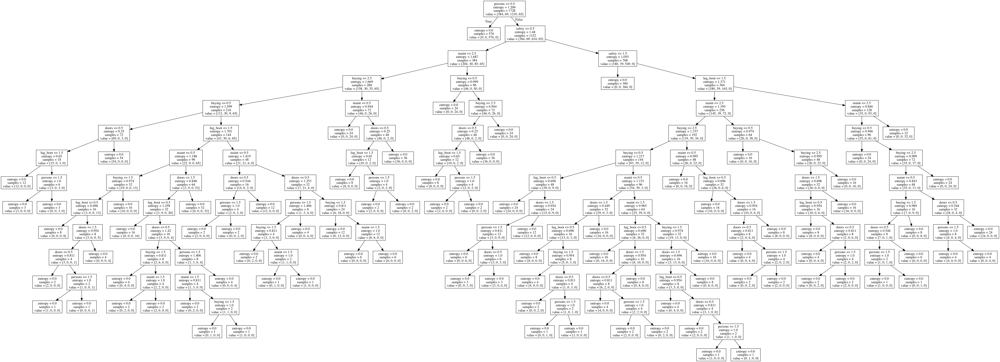



*********************************************************************
---------------------------------------------------------------------

*********************************** min_samples_leaf = 0.1 ***********************************


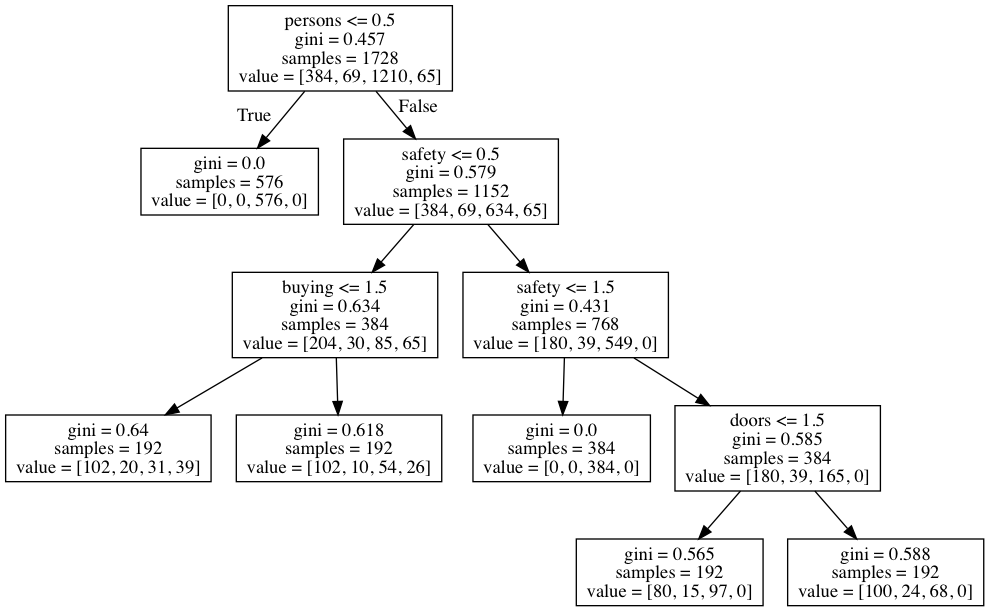



*********************************************************************
---------------------------------------------------------------------

*********************************** min_samples_leaf = 0.5 ***********************************


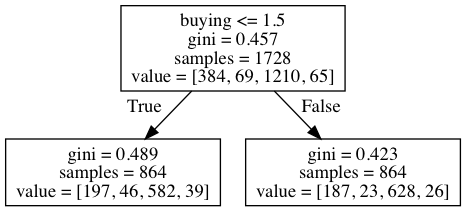



*********************************************************************
---------------------------------------------------------------------

*********************************** min_samples_leaf = 1 ***********************************


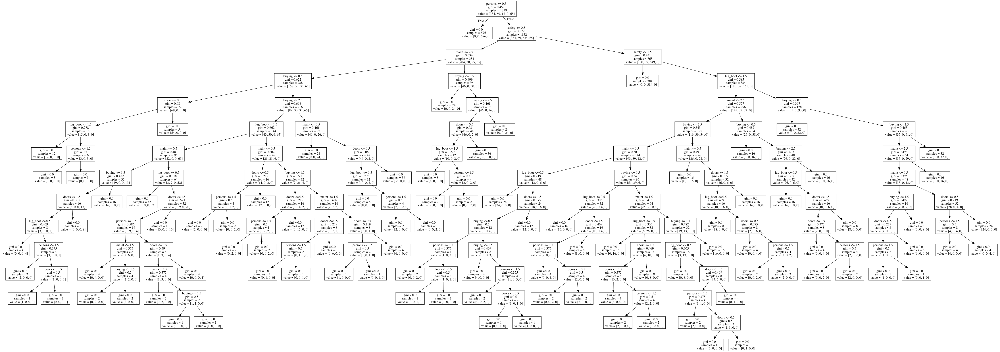



*********************************************************************
---------------------------------------------------------------------

*********************************** max_features = sqrt ***********************************


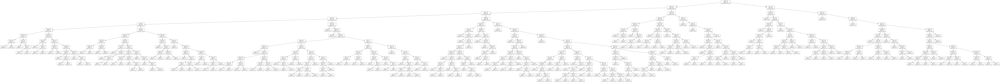



*********************************************************************
---------------------------------------------------------------------

*********************************** max_features = log2 ***********************************




*********************************************************************
---------------------------------------------------------------------

*********************************** max_features = None ***********************************


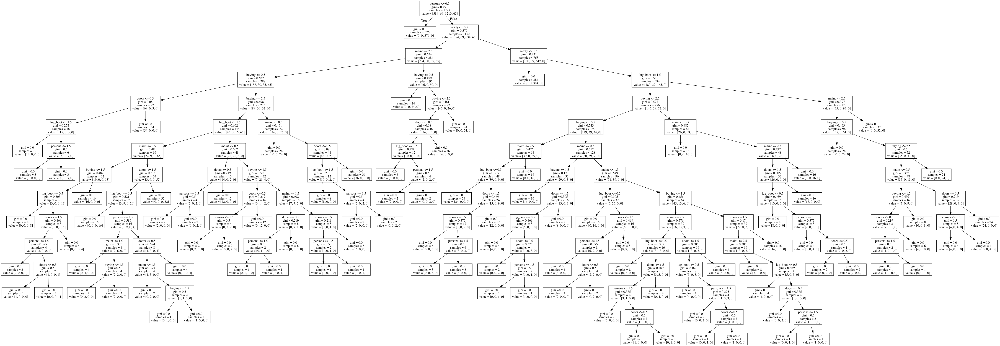

In [63]:
for param in params:
    for param_value in params[param]:
        clf = DecisionTreeClassifier(**{param: param_value})
        clf.fit(X, y)
        print('\n\n*********************************************************************')
        print('---------------------------------------------------------------------\n')
        print('*********************************** {} = {} ***********************************'.format(param, 
                                                                                                       param_value))
        draw_decision_tree(clf, columns[:-1])

Убедитесь, что увеличение глубины дерева и уменьшение количества объектов в листьях способствует гибкости модели и, как следствие, переобучению (что соответствует интуитивным соображениям о структуре дерева).

Действительно, при внимательном изучении рисунков видно, что при увеличении глубины дерева и уменьшении максимального количества объектов в листах хранится 1-2 элемента, то есть модель достаточно сильно подстроилась под обучающую выборку.

## Часть 3. Реализация алгоритма построения дерева решений

##### 50% баллов за задание, оценочное время выполнения 2-3 часа

In [200]:
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline
from sklearn.base import BaseEstimator
from sklearn.datasets import make_classification, make_regression, load_digits, load_boston
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, mean_squared_error
from multiprocessing.dummy import Pool as ThreadPool
import multiprocessing
import os
from tqdm import tqdm

Зафиксируем заранее `random_state` (a.k.a. random seed). Это должно повысить вероятность полной воспроизводимости результатов, впрочем, замечено, что тем не менее небольшие флуктуации возможны (например, качества прогнозов дерева, которое мы сейчас вырастим) в случае разных ОС.

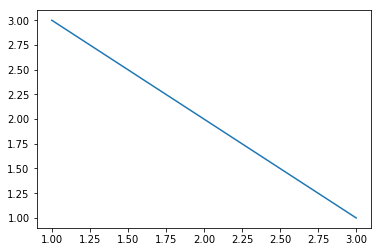

In [8]:
plt.plot([1, 2, 3], [3, 2, 1])
plt.show()

In [9]:
RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)

**Необходимо реализовать класс `DecisionTree`**

**Спецификация:**
- класс наследуется от `sklearn.BaseEstimator`;
- конструктор содержит следующие параметры: 
    `max_depth` - максимальная глубина дерева (по умолчанию - `numpy.inf`); 
    `min_samples_split` - минимальное число объектов в вершине, при котором происходит её разбиение (по умолчанию - 2); 
    `criterion` - критерий разбиения (для классификации - 'gini' или 'entropy', для регрессии - 'variance' или 'mad_median'; 
    по умолчанию - 'gini');
    
    Функционал, значение которого максимизируется для поиска оптимального разбиения в данной вершине имеет вид
    $$Q(X, j, t) = F(X) - \dfrac{|X_l|}{|X|} F(X_l) - \dfrac{|X_r|}{|X|} F(X_r),$$
    где $X$ - выборка, находящаяся в текущей вершине, $X_l$ и $X_r$ - разбиение выборки $X$ на две части 
    по предикату $[x_j < t]$, а $F(X)$ -критерий разбиения.
    
    1. Для классификации: пусть $p_i$ - доля объектов $i$-го класса в выборке $X$.
    
        - 'gini': Неопределенность Джини $F(X) = 1 -\sum_{i = 1}^K p_i^2$.
    
        - 'entropy': Энтропия $F(X) = -\sum_{i = 1}^K p_i \log_2(p_i)$.
    
    2. Для регрессии: $y_j = y(x_j)$ - ответ на объекте $x_j$, $y = (y_1, \dots, y_{|X|})$ - вектор ответов.
    
        - 'variance': Дисперсия (среднее квадратичное отклонение от среднего) $F(X) = \dfrac{1}{|X|} \sum_{x_j \in X}(y_j - \dfrac{1}{|X|}\sum_{x_i \in X}y_i)^2$
    
        - 'mad_median': Среднее отклонение от медианы $F(X) = \dfrac{1}{|X|} \sum_{x_j \in X}|y_j - \mathrm{med}(y)|$
    
- класс имеет методы `fit`, `predict` и `predict_proba`;
- метод `fit` принимает матрицу объектов `X` и вектор ответов `y` (объекты `numpy.ndarray`) и возвращает экземпляр класса
    `DecisionTree`, представляющий собой решающее дерево, обученное по выборке `(X, y)` с учётом заданных в конструкторе параметров; 
- метод `predict_proba` принимает матрицу объектов `X` и возвращает матрицу `P` размера `X.shape[0] x K`, где `K` - число классов, такую что $p_{ij}$ есть вероятность принадлежности объекта, заданного $i$-ой строкой матрицы X к классу $j \in \{1, \dots, K\}$.
- метод `predict` принимает матрицу объектов и возвращает вектор предсказанных ответов; в случае классификации - это 
    наиболее многочисленный класс в листе, в который попал объект, а в случае регрессии - среднее значение ответов по 
    всем объектам этого листа;

**Советы по реализации:**

- Обучение дерева можно реализовать простым жадным рекурсивным алгоритмом: каждый раз выбирать наилучшее разбиение (номер признака и порог по нему).
- Если возможных порогов для разбиения будет слишком много, выбор наилучшего разбиения окажется вычислительно очень громоздкой задачей. Можно ограничить множество порогов любым удобным способом (например, посчитать квантили значений каждого признака или просто взяв случайный набор порогов).
- Лучше не подсматривать решение в готовых нагугленных вариантах. От вас требуется сделать всего лишь максимально простую реализацию того, как строится и применяется решающее дерево, а не применимую на практике универсальную библиотеку.

### Реализация (30% баллов)

In [60]:
def entropy(y):  
    unique, p = np.unique(y, return_counts=True)
    p = p / len(y)
    return -np.sum(p * np.log2(p))

def gini(y):
    unique, p = np.unique(y, return_counts=True)
    p = p / len(y)
    return 1 - np.sum(p ** 2)

def variance(y):
    return np.var(y)

def mad_median(y):
    return np.mean(np.abs(y - np.median(y)))

In [243]:
class DecisionTree(BaseEstimator):
    def __init__(self, max_depth=np.inf, min_samples_split=2,
                 criterion='gini', n_jobs=1):
        assert criterion in ['gini', 'entropy', 'variance', 'mad_median'], 'bad criterion'
        self.criterion = criterion
        self._criterion_conventer = {
            'gini': gini,
            'entropy': entropy,
            'variance': variance,
            'mad_median': mad_median
        }

        self.max_depth = max_depth
        self.min_samples_split = min_samples_split
        self.criterion_f = self._criterion_conventer[self.criterion]
        self.n_jobs = n_jobs if n_jobs > 0 else multiprocessing.cpu_count()

    def _is_ok_for_split(self, y_mask, depth):
        if depth > self.max_depth or np.sum(y_mask) < self.min_samples_split:
            return False
        return True

    def _get_thresholds(self, arr, qth=np.linspace(0, 100, 9)[1:-1]):
        table_percentiles = np.percentile(arr, qth, axis=0)
        table_feature_indexes = np.ones_like(table_percentiles) * np.arange(table_percentiles.shape[1])
        return np.dstack((table_feature_indexes.ravel(), table_percentiles.ravel()))[0]

    def _calc_Q(self, j, t, y_mask):
        feature_mask = self._X[:, int(j)].ravel() < t
        left_mask = feature_mask * y_mask
        right_mask = (feature_mask == False) * y_mask
        len_all = np.sum(y_mask)
        len_l, len_r = np.sum(left_mask) / len_all, np.sum(right_mask) / len_all
        if len_l == 0 or len_r == 0:
            return -np.inf, left_mask, right_mask
        return self.criterion_f(self._y_train[y_mask]) - len_l * self.criterion_f(self._y_train[left_mask]) - \
               len_r * self.criterion_f(self._y_train[right_mask]), left_mask, right_mask
    
    def _calc_Q_stat_without_multiprocessing(self, thresholds, y_mask):
        Qs, lr_masks = [], []
        for j, t in thresholds:
            q, l_mask, r_mask = self._calc_Q(j, t, y_mask)
            Qs.append(q)
            lr_masks.append([l_mask, r_mask])
        return Qs, lr_masks


    def _calc_Q_stat_multiprocessing(self, thresholds, y_mask):
        pool = ThreadPool(self.n_jobs)
        Q_params = pool.map(lambda params: self._calc_Q(params[0], params[1], y_mask), thresholds)
        Qs, lr_masks = [], []
        for q, l_mask, r_mask in Q_params:
            Qs.append(q)
            lr_masks.append([l_mask, r_mask])
        return Qs, lr_masks

    def _get_leaf_y_for_one_element(self, x_element):
        is_leaf, *params = self._tree[0]
        while True:
            if is_leaf:
                y_mask = params[0]
                return self._y_train[y_mask]
            else:
                j, t = int(params[5]), params[6]
                if x_element[j] < t:
                    is_leaf, *params = self._tree[params[3]]
                else:
                    is_leaf, *params = self._tree[params[4]]

    def fit(self, X, y):
        assert len(X) == len(y), 'X, y must have equal len'
        assert len(X.shape) == 2, 'X must be np.array with two dimentions'
        self._X = X
        self._X_train_shape = X.shape
        self._y_train = y
        self._num_classes = len(np.unique(y))
        self._tree = []
        queue = [0]
        while len(queue) != 0:
            idx = queue.pop()
            if idx == 0:
                is_leaf, y_mask, depth, parent = False, np.ones_like(y, dtype=np.bool), 0, 0
                self._tree.append([is_leaf, y_mask, depth, parent])
            else:
                is_leaf, y_mask, depth, *_ = self._tree[idx]

            if self._is_ok_for_split(y_mask, depth):
                thresholds = self._get_thresholds(X[y_mask])
                if self.n_jobs == 1:
                    Qs, lr_masks = self._calc_Q_stat_without_multiprocessing(thresholds, y_mask)
                else:
                    Qs, lr_masks = self._calc_Q_stat_multiprocessing(thresholds, y_mask)
                
                argmax_Q = np.argmax(Qs)
                j, t = thresholds[argmax_Q]
                y_mask_left, y_mask_right = lr_masks[argmax_Q]
                self._tree.append([False, y_mask_left, depth + 1, idx])
                self._tree.append([False, y_mask_right, depth + 1, idx])
                self._tree[idx] += [len(self._tree) - 2, len(self._tree) - 1, j, t]
                queue.append(len(self._tree) - 2)
                queue.append(len(self._tree) - 1)
            else:
                self._tree[idx][0] = True

    def predict(self, X):
        if self.criterion in ['gini', 'entropy']:
            y_pred = np.array([np.bincount(self._get_leaf_y_for_one_element(x)).argmax() for x in X])
        else:
            y_pred = np.array([np.mean(self._get_leaf_y_for_one_element(x)) for x in X])
        return y_pred

    def predict_proba(self, X):
        assert self.criterion in ['gini', 'entropy'], 'predict_proba only in classification'
        proba = np.zeros((len(X), self._num_classes))
        tree_answers = [np.unique(self._get_leaf_y_for_one_element(x), return_counts=True) for x in X]
        for i, params in enumerate(tree_answers):
            unique_elements, counts = params
            proba[i, unique_elements] = counts / np.sum(counts)
        return proba

## Тестирование реализованного алгоритма

### Классификация (10% баллов)

С помощью метода `load_digits` загрузите датасет `digits`. Разделите выборку на обучающую и тестовую с помощью метода `train_test_split`, используйте значения параметров `test_size=0.2`, `random_state=42`. Попробуйте обучить неглубокие решающие деревья и убедитесь, что критерии gini и entropy дают разные результаты.

In [213]:
digits = load_digits()
X, y = digits['data'], digits['target']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

clf_gini = DecisionTree(max_depth=3, criterion='gini')
clf_entropy = DecisionTree(max_depth=3, criterion='entropy')

In [214]:
clf_gini.fit(X_train, y_train)
clf_entropy.fit(X_train, y_train)

In [215]:
y_pred_gini = clf_gini.predict(X_test)
y_pred_entropy = clf_entropy.predict(X_test)

print('gini acc: {:.2f}'.format(accuracy_score(y_test, y_pred_gini)))
print('entropy acc: {:.2f}'.format(accuracy_score(y_test, y_pred_entropy)))

gini acc: 0.66
entropy acc: 0.69


С помощью 5-кратной кросс-валидации (`GridSearchCV`) подберите оптимальное значение параметров `max_depth` и `criterion`. Для параметра `max_depth` используйте диапазон значений - range(3, 11), а для criterion - {'gini', 'entropy'}. Критерий качества `scoring`='accuracy'.

In [216]:
params = {
    'max_depth': range(3, 11),
    'criterion': ('gini', 'entropy')
}

est = DecisionTree(n_jobs=1)
grid = GridSearchCV(estimator=DecisionTree(), param_grid=params, scoring='accuracy', n_jobs=-1, cv=5)

In [217]:
grid.fit(X_train, y_train)

GridSearchCV(cv=5, error_score='raise',
       estimator=DecisionTree(criterion='gini', max_depth=inf, min_samples_split=2, n_jobs=1),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'max_depth': range(3, 11), 'criterion': ('gini', 'entropy')},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='accuracy', verbose=0)

In [218]:
grid.best_estimator_

DecisionTree(criterion='gini', max_depth=8, min_samples_split=2, n_jobs=1)

In [219]:
accuracy_score(y_test, grid.predict(X_test))

0.8527777777777777

Постройте графики средних значений критерия качества `accuracy` для критериев `gini` и `entropy` в зависимости от `max_depth`.

In [232]:
acc_test_gini, acc_test_entropy = [], []
acc_train_gini, acc_train_entropy = [], []
for max_depth in tqdm(range(2, 14)):
    clf_gini = DecisionTree(max_depth=max_depth, criterion='gini', n_jobs=-1)
    clf_entropy = DecisionTree(max_depth=max_depth, criterion='entropy', n_jobs=-1)
    clf_gini.fit(X_train, y_train)
    clf_entropy.fit(X_train, y_train)
    acc_test_gini.append(accuracy_score(y_test, clf_gini.predict(X_test)))
    acc_test_entropy.append(accuracy_score(y_test, clf_entropy.predict(X_test)))
    acc_train_gini.append(accuracy_score(y_train, clf_gini.predict(X_train)))
    acc_train_entropy.append(accuracy_score(y_train, clf_entropy.predict(X_train)))

100%|██████████| 12/12 [09:02<00:00, 45.24s/it]


max acc in test with gini and depth=10  is 0.86
max acc in test with entropy and depth=7  is 0.85


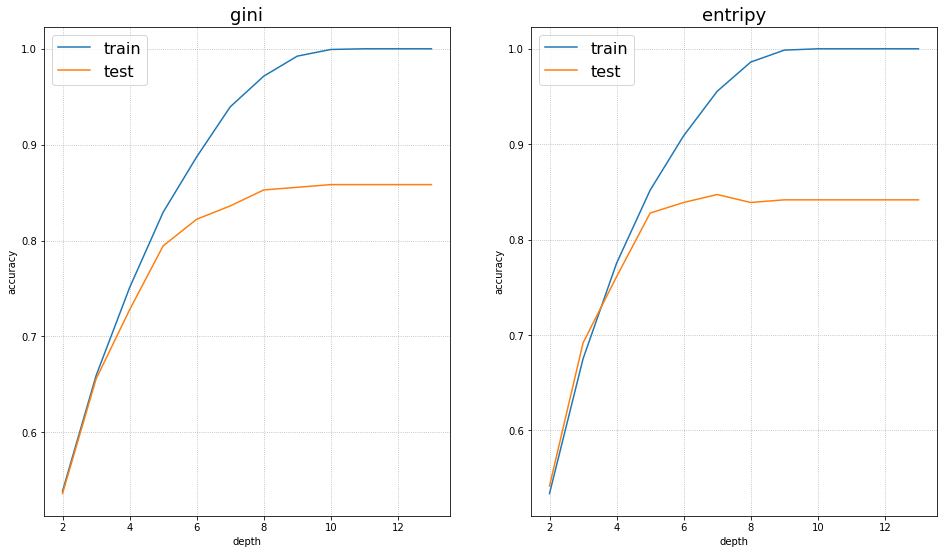

In [234]:
plt.figure(figsize=(16, 9))
depth = list(range(2, 14))
plt.subplot(1, 2, 1)
plt.plot(depth, acc_train_gini, label='train')
plt.plot(depth, acc_test_gini, label='test')
plt.legend(fontsize=16)
plt.title('gini', fontsize=18)
plt.xlabel('depth')
plt.ylabel('accuracy')
plt.grid(ls=':')
plt.subplot(1, 2, 2)
plt.plot(depth, acc_train_entropy, label='train')
plt.plot(depth, acc_test_entropy, label='test')
plt.legend(fontsize=16)
plt.title('entripy', fontsize=18)
plt.xlabel('depth')
plt.ylabel('accuracy')
plt.grid(ls=':')
print('max acc in test with gini and depth={}  is {:.2f}'.format(depth[np.argmax(acc_test_gini)], 
                                                                 np.max(acc_test_gini)))
print('max acc in test with entropy and depth={}  is {:.2f}'.format(depth[np.argmax(acc_test_entropy)], 
                                                                 np.max(acc_test_entropy)))

Проанализируйте полученные графики. Чему равны найденные оптимальные значения параметров max_depth и criterion?

Исходя из графиков, оптимальные значения параметров:

`max_depth = 10`

`criterion = gini`

Используя найденные оптимальные значения max_depth и criterion, обучите решающее дерево на X_train, y_train и вычислите вероятности принадлежности к классам для X_test.

In [246]:
optimal_max_depth = 10
optimal_criterion = 'gini'
optimal_clf = DecisionTree(max_depth=optimal_max_depth, criterion=optimal_criterion)
optimal_clf.fit(X_train, y_train)

In [247]:
class_proba = optimal_clf.predict_proba(X_test)

In [252]:
#  проверим, что матрица корректная:
accuracy_score(y_test, np.argmax(class_proba, axis=1))

0.8583333333333333

Для полученной матрицы вычислите усредненные по всем объектам из `X_test` значения вероятностей принадлежности к классам.

Чему примерно равна максимальная вероятность в полученном векторе?

In [255]:
print(np.mean(class_proba, axis=0))
print('max probability = {:.4f}'.format(np.max(np.mean(class_proba, axis=0))))

[0.10555556 0.08888889 0.08611111 0.07777778 0.11944444 0.13194444
 0.08055556 0.10277778 0.09583333 0.11111111]
max probability = 0.1319


### Регрессия (10% баллов)

С помощью метода `load_boston` загрузите датасет `boston`. Разделите выборку на обучающую и тестовую с помощью метода `train_test_split`, используйте значения параметров `test_size=0.2`, `random_state=42`. Попробуйте обучить неглубокие регрессионные деревья и убедитесь, что критерии `variance` и `mad_median` дают разные результаты.

In [259]:
boston = load_boston()
X, y = boston['data'], boston['target']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [260]:
reg_mad_median = DecisionTree(max_depth=3, criterion='mad_median')
reg_mad_median.fit(X_train, y_train)
reg_variance = DecisionTree(max_depth=3, criterion='variance')
reg_variance.fit(X_train, y_train)

In [262]:
y_mad_median = reg_mad_median.predict(X_test)
y_variance = reg_variance.predict(X_test)

print('mad_median acc: {:.2f}'.format(mean_squared_error(y_test, y_mad_median)))
print('variance acc: {:.2f}'.format(mean_squared_error(y_test, y_variance)))

mad_median acc: 20.03
variance acc: 19.10


Действительно, дают разные результаты

С помощью 5-кратной кросс-валидации подберите оптимальное значение параметров `max_depth` и `criterion`. Для параметра `max_depth` используйте диапазон значений - `range(2, 9)`, а для `criterion` - {'variance', 'mad_median'}. Критерий качества `scoring`='neg_mean_squared_error'.

In [263]:
params = {
    'max_depth': range(2, 9),
    'criterion': ['variance', 'mad_median']
}

est = DecisionTree(n_jobs=1)
grid = GridSearchCV(estimator=DecisionTree(), param_grid=params, 
                    scoring='neg_mean_squared_error', 
                    n_jobs=-1, cv=5)

In [264]:
grid.fit(X_train, y_train)

GridSearchCV(cv=5, error_score='raise',
       estimator=DecisionTree(criterion='gini', max_depth=inf, min_samples_split=2, n_jobs=1),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'max_depth': range(2, 9), 'criterion': ['variance', 'mad_median']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='neg_mean_squared_error', verbose=0)

In [265]:
grid.best_estimator_

DecisionTree(criterion='variance', max_depth=4, min_samples_split=2, n_jobs=1)

In [266]:
mean_squared_error(y_test, grid.predict(X_test))

19.188638811094467

Постройте графики средних значений критерия качества `neg_mean_squared_error` для критериев `variance` и `mad_median` в зависимости от `max_depth`.

In [271]:
mse_test_mad_median, mse_test_variance = [], []
mse_train_mad_median, mse_train_variance = [], []
for max_depth in tqdm(range(2, 12)):
    reg_mad_median = DecisionTree(max_depth=max_depth, criterion='mad_median', n_jobs=1)
    reg_variance = DecisionTree(max_depth=max_depth, criterion='variance', n_jobs=1)
    reg_mad_median.fit(X_train, y_train)
    reg_variance.fit(X_train, y_train)
    mse_test_mad_median.append(mean_squared_error(y_test, reg_mad_median.predict(X_test)))
    mse_test_variance.append(mean_squared_error(y_test, reg_variance.predict(X_test)))
    mse_train_mad_median.append(mean_squared_error(y_train, reg_mad_median.predict(X_train)))
    mse_train_variance.append(mean_squared_error(y_train, reg_variance.predict(X_train)))

100%|██████████| 10/10 [01:00<00:00,  6.03s/it]


min MSE in test with mad_median and depth=8  is 19.31
min MSE in test with variance and depth=3  is 19.10


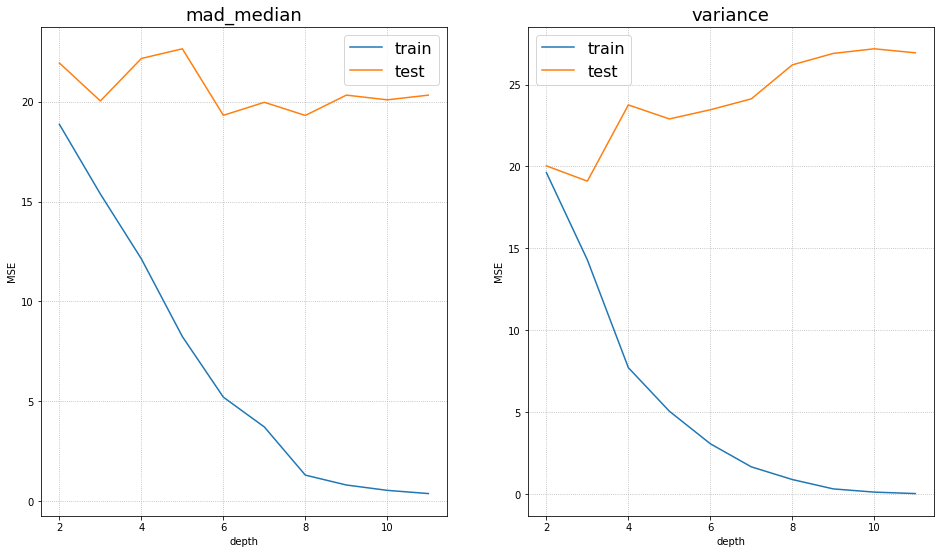

In [273]:
plt.figure(figsize=(16, 9))
depth = list(range(2, 12))
plt.subplot(1, 2, 1)
plt.plot(depth, mse_train_mad_median, label='train')
plt.plot(depth, mse_test_mad_median, label='test')
plt.legend(fontsize=16)
plt.title('mad_median', fontsize=18)
plt.xlabel('depth')
plt.ylabel('MSE')
plt.grid(ls=':')
plt.subplot(1, 2, 2)
plt.plot(depth, mse_train_variance, label='train')
plt.plot(depth, mse_test_variance, label='test')
plt.legend(fontsize=16)
plt.title('variance', fontsize=18)
plt.xlabel('depth')
plt.ylabel('MSE')
plt.grid(ls=':')
print('min MSE in test with mad_median and depth={}  is {:.2f}'.format(depth[np.argmin(mse_test_mad_median)], 
                                                                 np.min(mse_test_mad_median)))
print('min MSE in test with variance and depth={}  is {:.2f}'.format(depth[np.argmin(mse_test_variance)], 
                                                                 np.min(mse_test_variance)))

Проанализируйте полученные графики. Чему равны найденные оптимальные значения параметров max_depth и criterion

Исходя из графиков, оптимальные значения параметров:

`max_depth = 3`

`criterion = variance`